In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.image as mpimg
from scipy.optimize import curve_fit
from mw_plot import MWPlot
from astropy import units as u

# Galaxy map

In [2]:
km_kpc=3.2308e-17

R0 = 2.6e17
V0 = 220

# Define data - the Sun is at the origin

l_q1 = np.deg2rad(np.array([0,0,5,5,10,15,20,20,25,30,35,35,40,40,40,45,45,45,
                            50,50,55,55,60,65,65,70,70,75,75,80,80,85,85,90]))
l_q23 = np.deg2rad(np.array([95,100,105,110,110,115,115,120,120,125,125,130,130,
                             135,135,140,140,145,145,150,150,155,155,160,160,165,
                             165,170,170,175,175,180,190,195,200,200,200,205,205,
                             210,210,220,220,225,225,230,230,235,235]))
Vr_q1 = np.array([-38,-28,-37,-27,-26,-25,-35,-18,-27,-25,-87,-15,-29,3,29,-27,-3,
                  27,-23,18,-23,11,-15,-90,-14,-92,15,-93,-20,-86,-15,-90,-10,-7])
Vr_q23 = np.array([-10,-5,-4,-22,-65,-14,-76,-25,-70,-27,-70,-31,-65,-34,-74,-31,
                   -68,-27,63,-23,-54,-25,-52,-14,-41,-13,-36,-7,-32,-4,-22,-9,-4,
                   0,98,-4,18,42,9,51,11,58,16,80,25,84,33,85,33])

def calc_R(l, v):
    return (R0*V0*np.sin(l))/((V0*np.sin(l) + v))

Rs_q1 = calc_R(l_q1, Vr_q1)
Rs_q23 = calc_R(l_q23, Vr_q23)

# For the first quadrant, there are two possible solutions. 
# It is possible for both solutions to be positive and thus valid, so we have to calculate both.
rs_q1_sol1 = np.sqrt((Rs_q1**2) - (R0**2)*np.sin(l_q1)**2) + R0*np.cos(l_q1)
rs_q1_sol2 = -np.sqrt((Rs_q1**2) - (R0**2)*np.sin(l_q1)**2) + R0*np.cos(l_q1)

/home/lmartini/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in sqrt
/home/lmartini/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in sqrt


In [3]:
# For the solutions in quadrant 1, if there were two solutions we can plot them and compare 
# against a map of the galaxy to choose the more likely solution
dupes = []

ls = []
rs = []

for i in range(len(l_q1)):
    s1 = rs_q1_sol1[i]
    s2 = rs_q1_sol2[i]
    if s1 >= 0 and s2 >= 0:
        print("Two positive solutions at " + str(np.rad2deg(l_q1[i])) + ": (" + str(s1) +  ", " + str(s2) + ")")
        dupes.append((l_q1[i], s1, s2))
    elif s1 < 0 and s2 < 0:
        print("Double negative at " + str(np.rad2deg(l_q1[i])) + ": (" + str(s1) +  ", " + str(s2) + ")")
    elif s1 > 0: 
        ls.append(l_q1[i])
        rs.append(s1)
    elif s2 > 0:
        ls.append(l_q1[i])
        rs.append(s2)

Two positive solutions at 0.0: (2.6e+17, 2.6e+17)
Two positive solutions at 0.0: (2.6e+17, 2.6e+17)
Two positive solutions at 40.0: (3.91238925976167e+17, 7104184445701568.0)
Two positive solutions at 40.0: (3.356243479130157e+17, 6.271876250885286e+16)
Two positive solutions at 45.0: (3.0747360903049926e+17, 6.022191718650547e+16)
Two positive solutions at 50.0: (2.916779020826272e+17, 4.257165495437322e+16)
Two positive solutions at 55.0: (2.703146028369476e+17, 2.7945144065596416e+16)


In [4]:
# For quadrants 2 and 3, only one positive solution is possible, and we can ignore the r- solutions
rs_q23_sol1 = np.sqrt((Rs_q23**2) - (R0**2)*np.sin(l_q23)**2) + R0*np.cos(l_q23) # r+ --> Some of these are negative, but not all
for i in range(len(l_q23)):
    s = rs_q23_sol1[i]
    if s > 0:
        ls.append(l_q23[i])
        rs.append(s)

In [5]:
rs = np.array(rs)
ls = np.array(ls)
print(np.shape(rs))
print(np.shape(ls))

(70,)
(70,)


In [6]:
# When converting to cartesian coordinates, we have to convert l to theta
# theta is 90 degrees "ahead" of l, since l=0 is on the negative y-axis
θs = ls - np.pi/2

In [7]:
xs = rs*np.cos(θs)
ys = rs*np.sin(θs)

In [8]:
xs = xs * km_kpc
ys = ys * km_kpc

In [9]:
# These are solutions in quadrant 1 where both were positive. We choose one to plot based on the galactic structure.
x_dupes1 = []
y_dupes1 = []

x_dupes2 = []
y_dupes2 = []

for l, r1, r2 in dupes:
    θ = l - np.pi/2
    x_dupes1.append(r1*np.cos(θ))
    y_dupes1.append(r1*np.sin(θ))
    x_dupes2.append(r2*np.cos(θ))
    y_dupes2.append(r2*np.sin(θ))

x_dupes1 = np.array(x_dupes1)*km_kpc
y_dupes1 = np.array(y_dupes1)*km_kpc
x_dupes2 = np.array(x_dupes2)*km_kpc
y_dupes2 = np.array(y_dupes2)*km_kpc

<IPython.core.display.Javascript object>


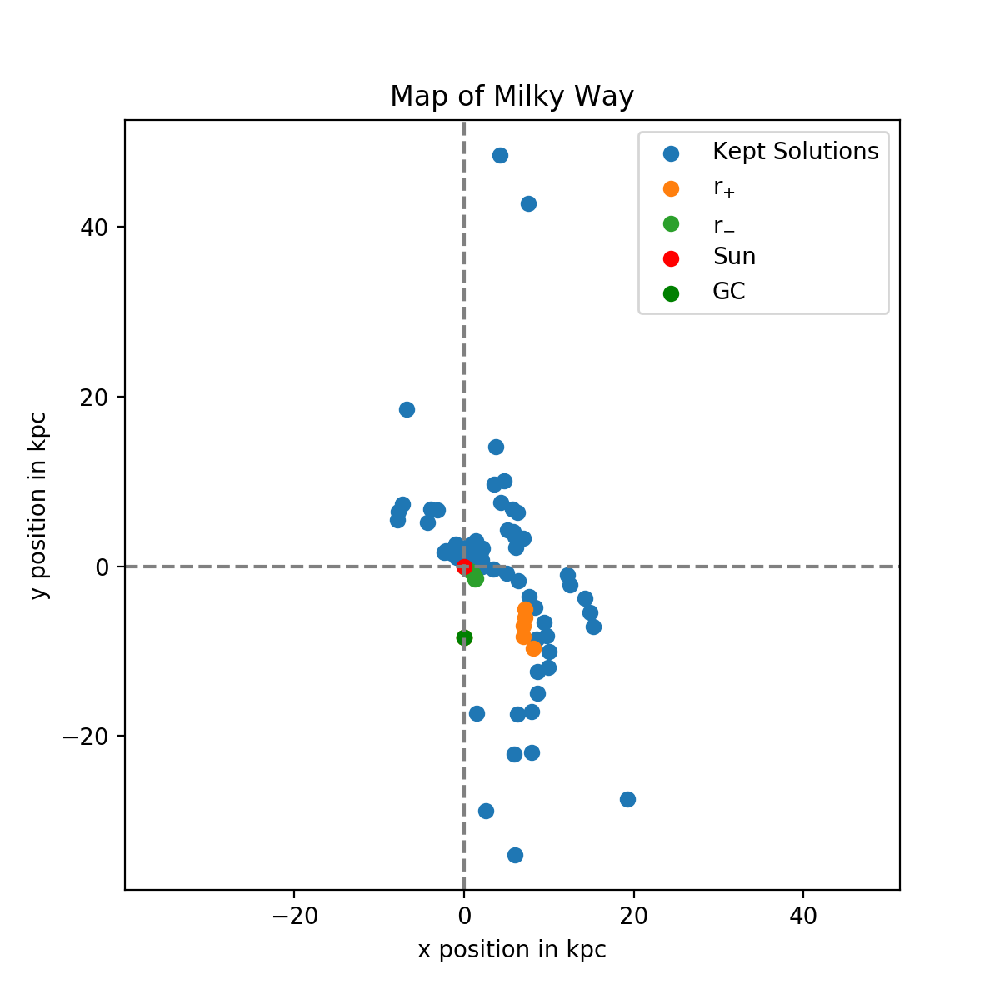

In [11]:
fig, ax = plt.subplots(figsize=(6,6))

plt.axvline(0, c=(.5, .5, .5), ls='--')
plt.axhline(0, c=(.5, .5, .5), ls='--')

plt.scatter(xs,ys, label= 'Kept Solutions')
plt.scatter(x_dupes1, y_dupes1 , label= 'r$_{+}$')
plt.scatter(x_dupes2, y_dupes2 , label= 'r$_{-}$')

plt.scatter(0, 0, color="r", label="Sun")
plt.scatter(0, -R0*km_kpc, color="g", label="GC")

plt.title("Map of Milky Way")
plt.ylabel("y position in kpc")
plt.xlabel("x position in kpc")
#print(new_first_quad_l_rad_arr)

ax.set_aspect('equal', adjustable='datalim')

# plt.tight_layout()
plt.legend()

<IPython.core.display.Javascript object>


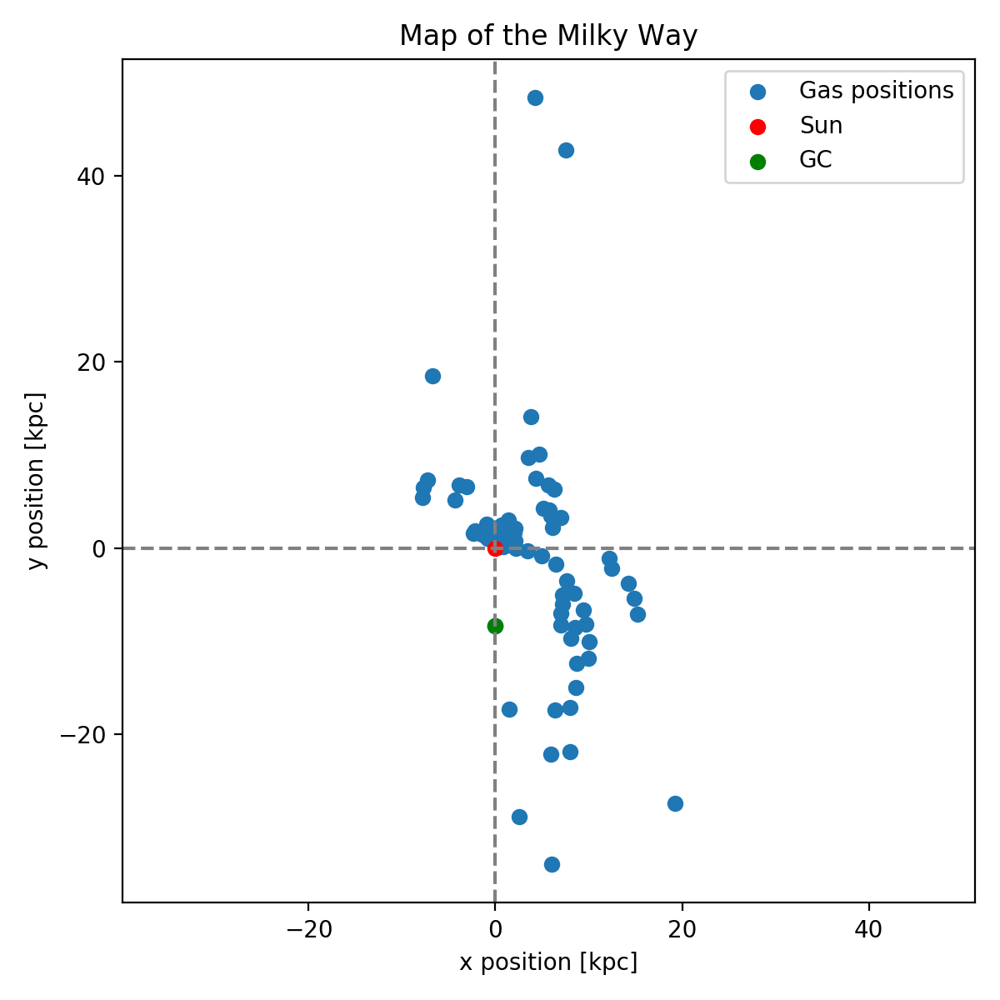

In [13]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

fig, ax = plt.subplots(figsize=(6,6))

plt.axvline(0, c=(.5, .5, .5), ls='--')
plt.axhline(0, c=(.5, .5, .5), ls='--')

plt.scatter(xs,ys, color=colors[0], label= 'Gas positions')
plt.scatter(x_dupes1, y_dupes1 , color=colors[0])
#plt.scatter(x_dupes2, y_dupes2, color=colors[0])

plt.scatter(0, 0, color="r", label="Sun")
plt.scatter(0, -R0*km_kpc, color="g", label="GC")

plt.title("Map of the Milky Way")
plt.ylabel("y position [kpc]")
plt.xlabel("x position [kpc]")

ax.set_aspect('equal', adjustable='datalim')

plt.tight_layout()
plt.legend()

<IPython.core.display.Javascript object>


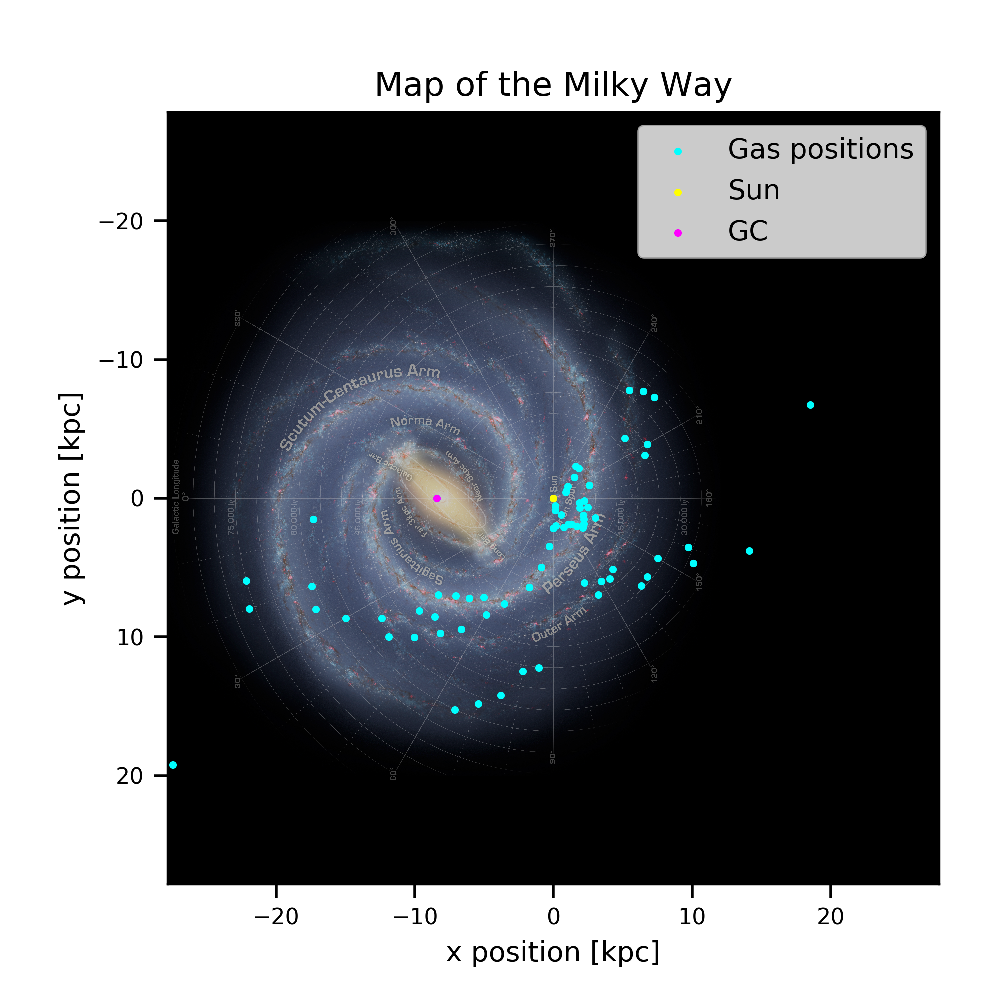

In [14]:
# setup MWPlot instance, you have to specify center, radius, unit with astropy unit and choice of coord
# or not specifying any to use default value shown below
# center: Coordinates of the center of the plot, you cannot change this after creating the instance
# radius: Radius of the plot, you cannot change this after creating the instance
# coord: can be 'galactocentric' or 'galactic'
# annotation: whether use a milkyway background with annotation
# mode: can be 'face-on' or 'edge-on'
# rot180: whether to rotate the plot by 180degree, putting Earth location from left hand (-8, 0)kpc to right side (8, 0)kpc
# grayscale: whether to turn the background image to grayscale

plot_instance = MWPlot(mode='face-on', center=(0, 0)*u.kpc, radius=90750*u.lyr,
                       unit=u.kpc, coord='galactic', annotation=True, rot180=False, grayscale=False)

# Here are some setting you can set after setting up a MWPlot instance
plot_instance.fontsize = 10  # fontsize for matplotlib plotting
plot_instance.figsize = (5, 5)  # figsize for matplotlib plotting
#plot_instance.dpi = 200  # dpi for matplotlib plotting
#plot_instance.cmap = 'viridis'  # matplotlib cmap: https://matplotlib.org/examples/color/colormaps_reference.html
#plot_instance.clim = (vmin, vmax) # colorbar range
plot_instance.imalpha = 0.8  # alpha value for the milkyway image
plot_instance.s = 3.0  # make the scatter points bigger
plot_instance.tight_layout = True # whether plt.tight_layout() will be run

#plot_instance.scatter(y_dupes2*u.kpc, x_dupes2*u.kpc, color='cyan')
plot_instance.scatter(y_dupes1*u.kpc, x_dupes1*u.kpc, color='cyan', alpha=1.0, zorder=3)
plot_instance.scatter(ys*u.kpc, xs*u.kpc, color='cyan', label= 'Gas positions', alpha=1.0, zorder=3)
plot_instance.scatter(0*u.kpc, 0*u.kpc, color='yellow', label="Sun", alpha=1.0, zorder=3)
plot_instance.scatter(-R0*km_kpc*u.kpc, 0*u.kpc, color="magenta", label="GC", alpha=1.0, zorder=3)

plt.title("Map of the Milky Way")
plt.ylabel("y position [kpc]")
plt.xlabel("x position [kpc]")
#print(new_first_quad_l_rad_arr)
plt.legend()

# Show the figure
plot_instance.show()

## Just the galaxy with no points

<IPython.core.display.Javascript object>


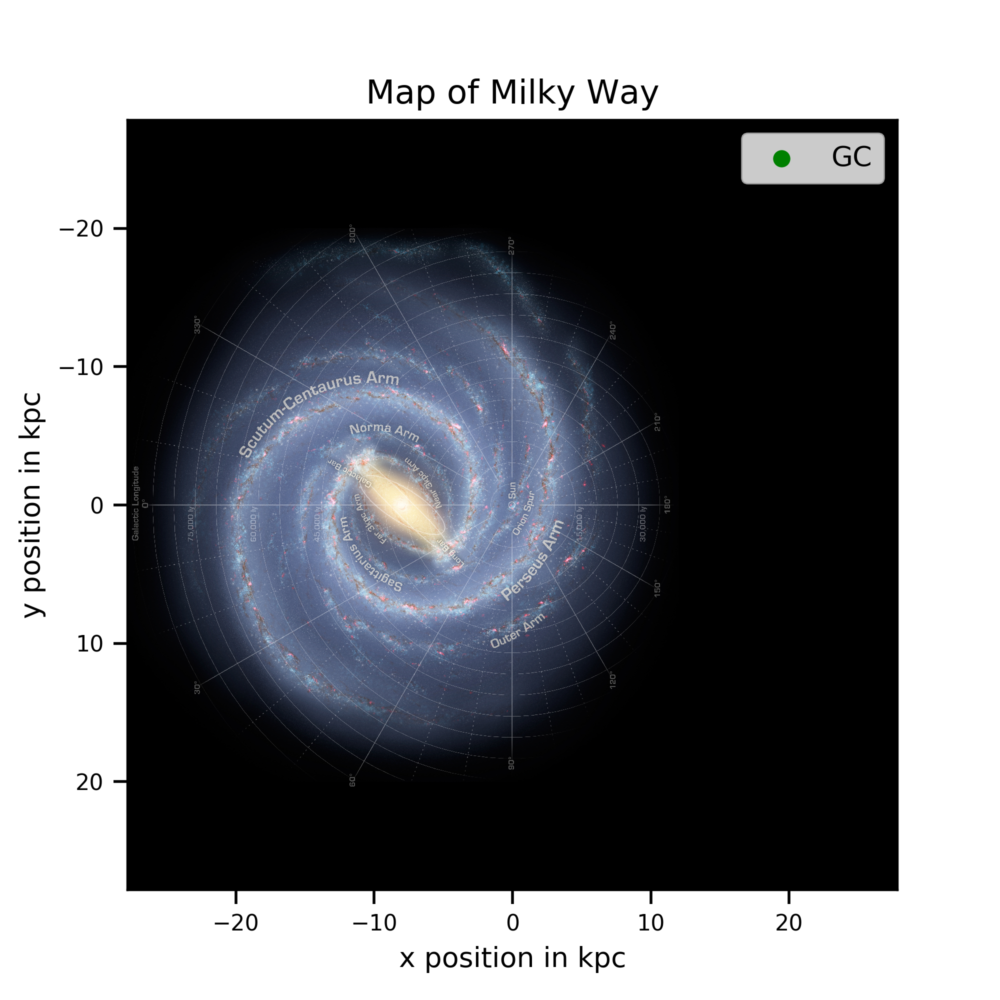

Text(0.5, 0, 'x position in kpc')

In [15]:
plot_instance = MWPlot(mode='face-on', center=(0, 0)*u.kpc, radius=90750*u.lyr,
                       unit=u.kpc, coord='galactic', annotation=True, rot180=False, grayscale=False)

# Here are some setting you can set after setting up a MWPlot instance
plot_instance.fontsize = 10  # fontsize for matplotlib plotting
plot_instance.figsize = (5, 5)  # figsize for matplotlib plotting
#plot_instance.dpi = 200  # dpi for matplotlib plotting
#plot_instance.cmap = 'viridis'  # matplotlib cmap: https://matplotlib.org/examples/color/colormaps_reference.html
#plot_instance.clim = (vmin, vmax) # colorbar range
plot_instance.imalpha = 1.0  # alpha value for the milkyway image
plot_instance.s = 3.0  # make the scatter points bigger
plot_instance.tight_layout = True # whether plt.tight_layout() will be run

plot_instance.scatter(-R0*km_kpc*u.kpc, 0*u.kpc, color="g", label="GC")

plt.title("Map of Milky Way")
plt.ylabel("y position in kpc")
plt.xlabel("x position in kpc")
#print(new_first_quad_l_rad_arr)
#plt.legend()

## Without quadrant 2 and 3 outliers

<IPython.core.display.Javascript object>


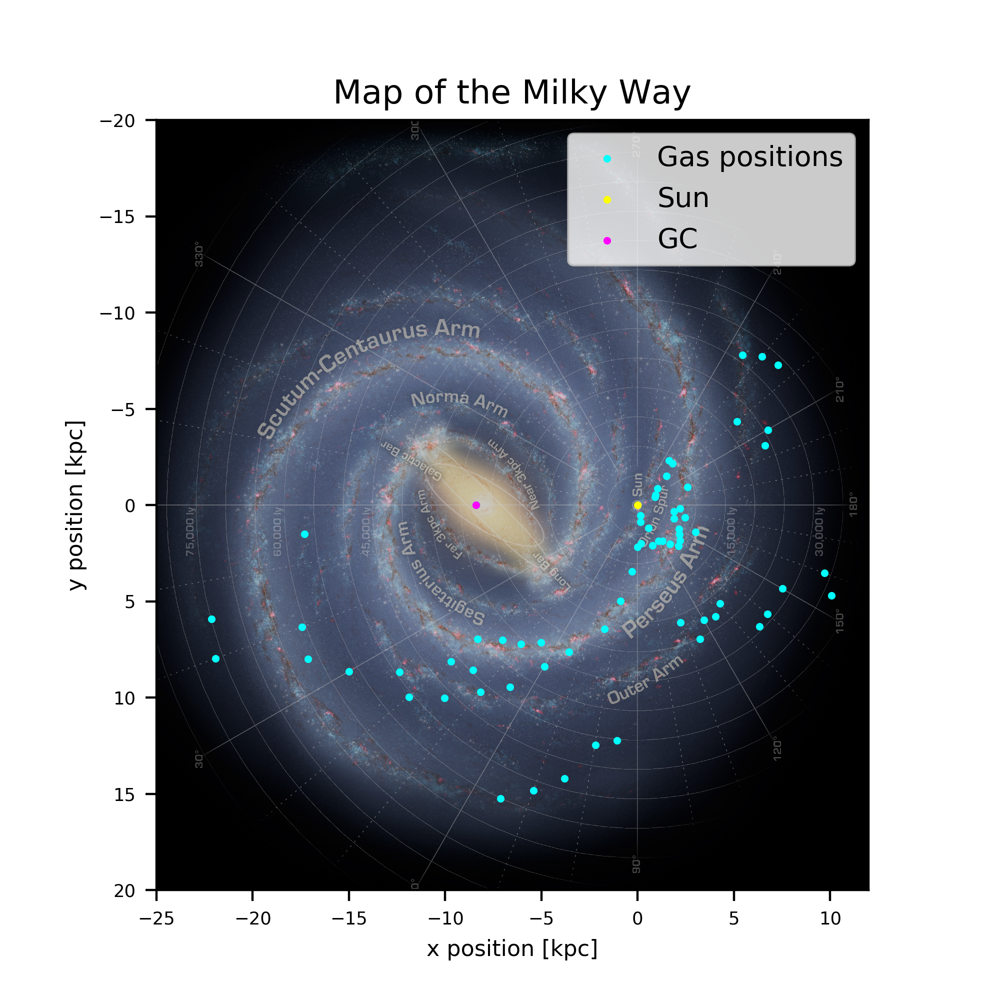

In [16]:
plot_instance = MWPlot(mode='face-on', center=(0, 0)*u.kpc, radius=90750*u.lyr,
                       unit=u.kpc, coord='galactic', annotation=True, rot180=False, grayscale=False)

# Here are some setting you can set after setting up a MWPlot instance
plot_instance.fontsize = 8  # fontsize for matplotlib plotting
plot_instance.figsize = (5, 5)  # figsize for matplotlib plotting
#plot_instance.dpi = 200  # dpi for matplotlib plotting
#plot_instance.cmap = 'viridis'  # matplotlib cmap: https://matplotlib.org/examples/color/colormaps_reference.html
#plot_instance.clim = (vmin, vmax) # colorbar range
plot_instance.imalpha = 0.8  # alpha value for the milkyway image
plot_instance.s = 3.0  # make the scatter points bigger
plot_instance.tight_layout = True # whether plt.tight_layout() will be run

plot_instance.scatter(y_dupes1*u.kpc, x_dupes1*u.kpc, color='cyan', alpha=1.0, zorder=3)
plot_instance.scatter(ys*u.kpc, xs*u.kpc, color='cyan', label= 'Gas positions', alpha=1.0, zorder=3)
plot_instance.scatter(0*u.kpc, 0*u.kpc, color='yellow', label="Sun", alpha=1.0, zorder=3)
plot_instance.scatter(-R0*km_kpc*u.kpc, 0*u.kpc, color="magenta", label="GC", alpha=1.0, zorder=3)

plt.xlim([-25, 12])
plt.ylim([20, -20])

plt.title("Map of the Milky Way")
plt.ylabel("y position [kpc]")
plt.xlabel("x position [kpc]")
plt.legend()

## Distinguish points between spiral arms

In [62]:
# selected_sc = []
# selected_outer = []
# selected_perseus = []
# selected_orion = []

In [25]:
xs_all = np.concatenate([xs, x_dupes1])
ys_all = np.concatenate([ys, y_dupes1])

In [71]:
# plot_instance = MWPlot(mode='face-on', center=(0, 0)*u.kpc, radius=90750*u.lyr,
#                        unit=u.kpc, coord='galactic', annotation=True, rot180=False, grayscale=False)

# # Here are some setting you can set after setting up a MWPlot instance
# plot_instance.fontsize = 8  # fontsize for matplotlib plotting
# plot_instance.figsize = (5, 5)  # figsize for matplotlib plotting
# #plot_instance.dpi = 200  # dpi for matplotlib plotting
# #plot_instance.cmap = 'viridis'  # matplotlib cmap: https://matplotlib.org/examples/color/colormaps_reference.html
# #plot_instance.clim = (vmin, vmax) # colorbar range
# plot_instance.imalpha = 0.8  # alpha value for the milkyway image
# plot_instance.s = 3.0  # make the scatter points bigger
# plot_instance.tight_layout = False # whether plt.tight_layout() will be run

# #plot_instance.scatter(y_dupes1*u.kpc, x_dupes1*u.kpc, color='cyan', alpha=1.0, zorder=3, picker=10)
# #plot_instance.scatter(ys*u.kpc, xs*u.kpc, color='cyan', label= 'Gas positions', alpha=1.0, zorder=3, picker=10)
# #plot_instance.scatter(0*u.kpc, 0*u.kpc, color="orange", label="Sun", alpha=1.0, zorder=3)
# #plot_instance.scatter(-R0*km_kpc*u.kpc, 0*u.kpc, color="purple", label="GC", alpha=1.0, zorder=3)

# dat = plot_instance.scatter(ys_all*u.kpc, xs_all*u.kpc, color='cyan', label= 'Gas positions', alpha=1.0, zorder=3, picker=10)

# def onpick(event):
#     #loc = event.artist.get_cursor_data(event)
#     x = xs_all[event.ind]
#     y = ys_all[event.ind]
#     print((y, x), "clicked")
    
# #     c = colors.ColorConverter.to_rgba('magenta')
# #     print(event.artist)
# #     print(event.artist._facecolors)
# #     event.artist._facecolors[event.ind,:] = c
#     #coll._facecolors[event.ind,:] = (1, 0, 0, 1)
    
#     #print(event.artist.to_rgba(c[idx]))
    
#     #plt.draw()
#     #selected_orion.append(event.ind)
#     #print(event.artist.get_paths())
    
# reg = plot_instance.fig.canvas.mpl_connect('pick_event', onpick)

# plt.xlim([-25, 12])
# plt.ylim([20, -20])

# plt.title("Map of the Milky Way")
# plt.ylabel("y position [kpc]")
# plt.xlabel("x position [kpc]")
# plt.legend()

In [106]:
# f_name = 'spiral_arms.npz'
# save_file = '/mnt/c/Users/lmart/Documents/tmp/' + f_name
# np.savez(save_file, sc=selected_sc, perseus=selected_perseus, outer=selected_outer, orion=selected_orion)
# print("File saved")

## Plot with colored spiral arms

In [36]:
with np.load('spiral_arms.npz', allow_pickle=True) as data:
    print(data.files)
    selected_sc = data['sc']
    selected_outer = data['outer']
    selected_orion = data['orion']
    selected_perseus = data['perseus']

['sc', 'perseus', 'outer', 'orion']


<IPython.core.display.Javascript object>


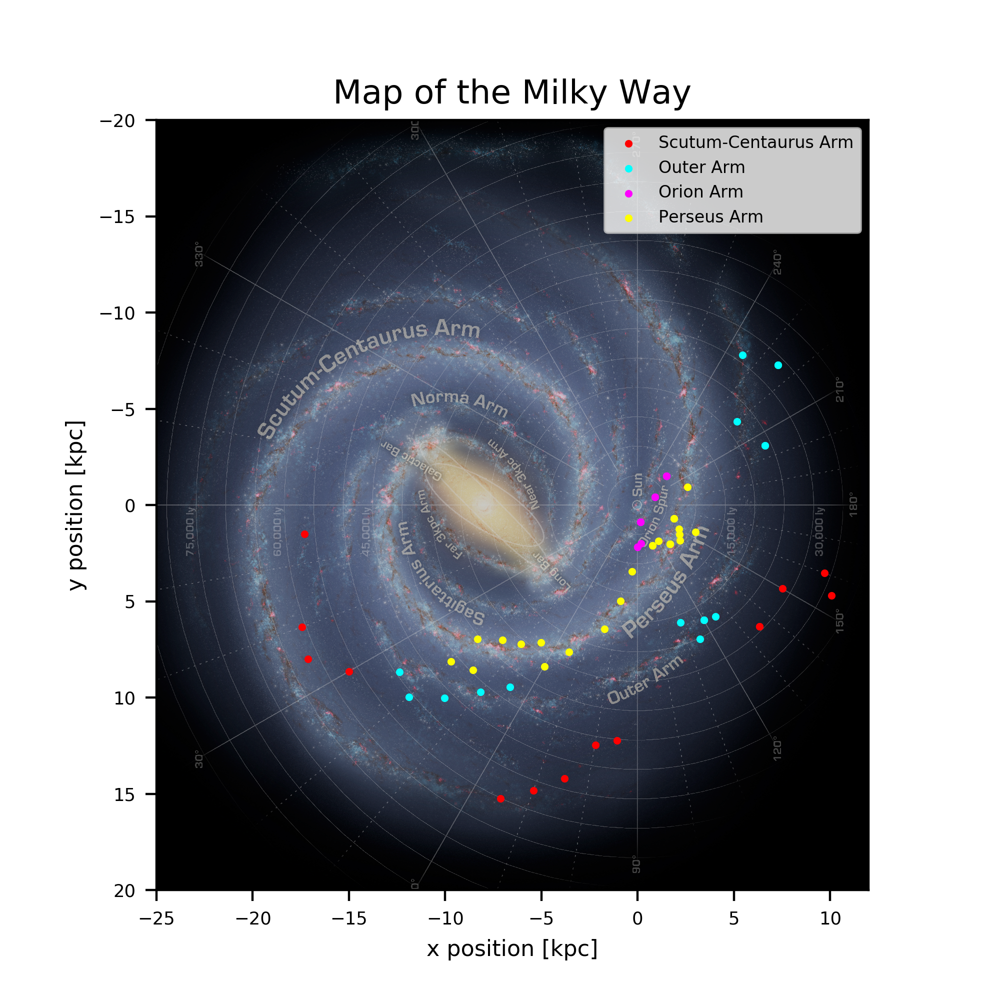

In [37]:
plot_instance = MWPlot(mode='face-on', center=(0, 0)*u.kpc, radius=90750*u.lyr,
                       unit=u.kpc, coord='galactic', annotation=True, rot180=False, grayscale=False)

# Here are some setting you can set after setting up a MWPlot instance
plot_instance.fontsize = 8  # fontsize for matplotlib plotting
plot_instance.figsize = (5, 5)  # figsize for matplotlib plotting
#plot_instance.dpi = 200  # dpi for matplotlib plotting
#plot_instance.cmap = 'viridis'  # matplotlib cmap: https://matplotlib.org/examples/color/colormaps_reference.html
#plot_instance.clim = (vmin, vmax) # colorbar range
plot_instance.imalpha = 0.8  # alpha value for the milkyway image
plot_instance.s = 3.0  # make the scatter points bigger
plot_instance.tight_layout = True # whether plt.tight_layout() will be run

#plot_instance.scatter(y_dupes1*u.kpc, x_dupes1*u.kpc, color='cyan', alpha=1.0, zorder=3, picker=10)
#plot_instance.scatter(ys*u.kpc, xs*u.kpc, color='cyan', label= 'Gas positions', alpha=1.0, zorder=3, picker=10)
#plot_instance.scatter(0*u.kpc, 0*u.kpc, color="orange", label="Sun", alpha=1.0, zorder=3)
#plot_instance.scatter(-R0*km_kpc*u.kpc, 0*u.kpc, color="purple", label="GC", alpha=1.0, zorder=3)

plot_instance.scatter(ys_all[np.array([s[0] for s in selected_sc])]*u.kpc, xs_all[np.array([s[0] for s in selected_sc])]*u.kpc, color='red', label= 'Scutum-Centaurus Arm', alpha=1.0, zorder=3, picker=10)
plot_instance.scatter(ys_all[np.array([s[0] for s in selected_outer])]*u.kpc, xs_all[np.array([s[0] for s in selected_outer])]*u.kpc, color='cyan', label= 'Outer Arm', alpha=1.0, zorder=3, picker=10)
plot_instance.scatter(ys_all[np.array([s[0] for s in selected_orion])]*u.kpc, xs_all[np.array([s[0] for s in selected_orion])]*u.kpc, color='magenta', label= 'Orion Arm', alpha=1.0, zorder=3, picker=10)
plot_instance.scatter(ys_all[np.array([s[0] for s in selected_perseus])]*u.kpc, xs_all[np.array([s[0] for s in selected_perseus])]*u.kpc, color='yellow', label= 'Perseus Arm', alpha=1.0, zorder=3, picker=10)

plt.xlim([-25, 12])
plt.ylim([20, -20])

plt.title("Map of the Milky Way")
plt.ylabel("y position [kpc]")
plt.xlabel("x position [kpc]")
plt.legend(prop={'size': 6})

## Data plotted in v - l space to compare with figure 2.6 in the manual

In [45]:
l_q1 = np.array([0,0,5,5,10,15,20,20,25,30,35,35,40,40,40,45,45,45,
                            50,50,55,55,60,65,65,70,70,75,75,80,80,85,85,90])
l_q23 = np.array([95,100,105,110,110,115,115,120,120,125,125,130,130,
                             135,135,140,140,145,145,150,150,155,155,160,160,165,
                             165,170,170,175,175,180,190,195,200,200,200,205,205,
                             210,210,220,220,225,225,230,230,235,235])
Vr_q1 = np.array([-38,-28,-37,-27,-26,-25,-35,-18,-27,-25,-87,-15,-29,3,29,-27,-3,
                  27,-23,18,-23,11,-15,-90,-14,-92,15,-93,-20,-86,-15,-90,-10,-7])
Vr_q23 = np.array([-10,-5,-4,-22,-65,-14,-76,-25,-70,-27,-70,-31,-65,-34,-74,-31,
                   -68,-27,63,-23,-54,-25,-52,-14,-41,-13,-36,-7,-32,-4,-22,-9,-4,
                   0,98,-4,18,42,9,51,11,58,16,80,25,84,33,85,33])

l_all = np.concatenate([l_q1, l_q23])
Vr_all = np.concatenate([Vr_q1, Vr_q23])

In [47]:
l_all[l_all > 180] -= 360

<IPython.core.display.Javascript object>


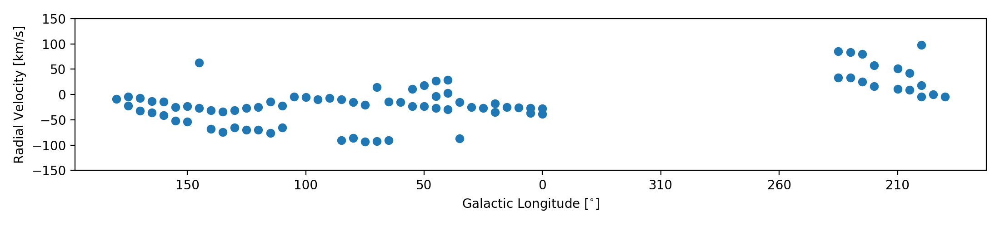

In [48]:
fig, ax = plt.subplots(figsize=(11, 2.5))

plt.scatter(l_all, Vr_all)

# Make the x-axis match the one in fig 2.6 for easier comparison
ticks = ax.get_xticks()
ticks[ticks < 0] += 360
ax.set_xticklabels([int(tick) for tick in ticks])
ax.invert_xaxis()

plt.ylim([-150, 150])
plt.xlabel("Galactic Longitude [$^{\circ}$]")
plt.ylabel("Radial Velocity [km/s]")
plt.tight_layout()

<IPython.core.display.Javascript object>


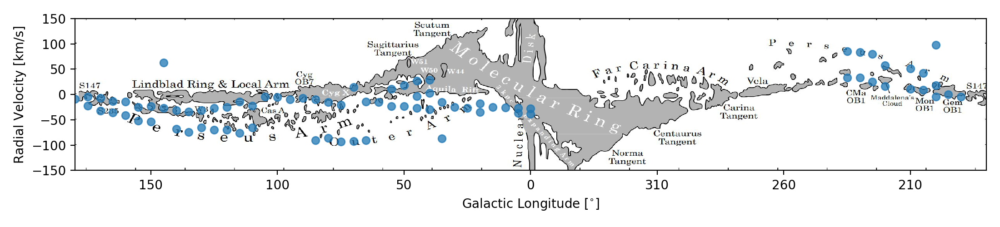

In [49]:
fig, ax = plt.subplots(figsize=(11, 2.5))

plt.scatter(l_all, Vr_all, alpha=0.75)

#Make the x-axis match the one in fig 2.6 for easier comparison
ticks = ax.get_xticks()
ticks[ticks < 0] += 360
ax.set_xticklabels([int(tick) for tick in ticks])
ax.invert_xaxis()

img_path = '/mnt/c/Users/lmart/Documents/tmp/vl_space_no_axes.JPG' 
img = mpimg.imread(img_path)
ax.imshow(img, extent=[180, -180, 150, -150], aspect='auto', origin='lower')

plt.ylim([-150, 150])
plt.xlabel("Galactic Longitude [$^{\circ}$]")
plt.ylabel("Radial Velocity [km/s]")
plt.tight_layout()

# Rotation Curve

<IPython.core.display.Javascript object>


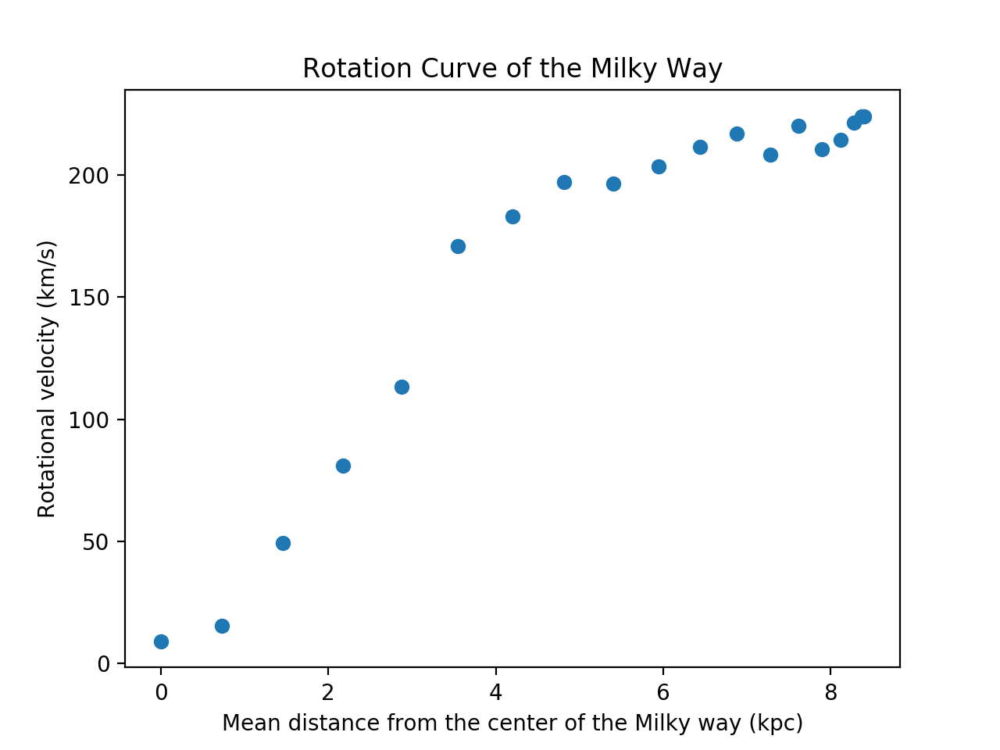

In [24]:
R0 = 2.6e17
V0 = 220
km_kpc=3.2308e-17

base_angle = 0
l_rad =[base_angle + n*(5*(np.pi/180)) for n in range(19)] #Making array of angles in radians

sin_l_rad_arr=( np.sin(l_rad)) #taking the sine of the angles
RT_arr_km = R0*sin_l_rad_arr #multiplying by R0 in km
RT_arr_kpc = km_kpc*RT_arr_km #converting to kpc

Vr = [9,-4,11,24,38,78,73,71,55,48,43,37,18,21,4,2,5,5,4]
VT = Vr + V0*sin_l_rad_arr

fig = plt.figure()
plt.scatter(RT_arr_kpc,VT)
plt.title("Rotation Curve of the Milky Way")
plt.ylabel("Rotational velocity (km/s)")
plt.xlabel("Mean distance from the center of the Milky way (kpc)")

# Solar Intensity Scans

## Right Ascension

Mean:  145.9817247796744
Std:  1.9885039700108846


<IPython.core.display.Javascript object>


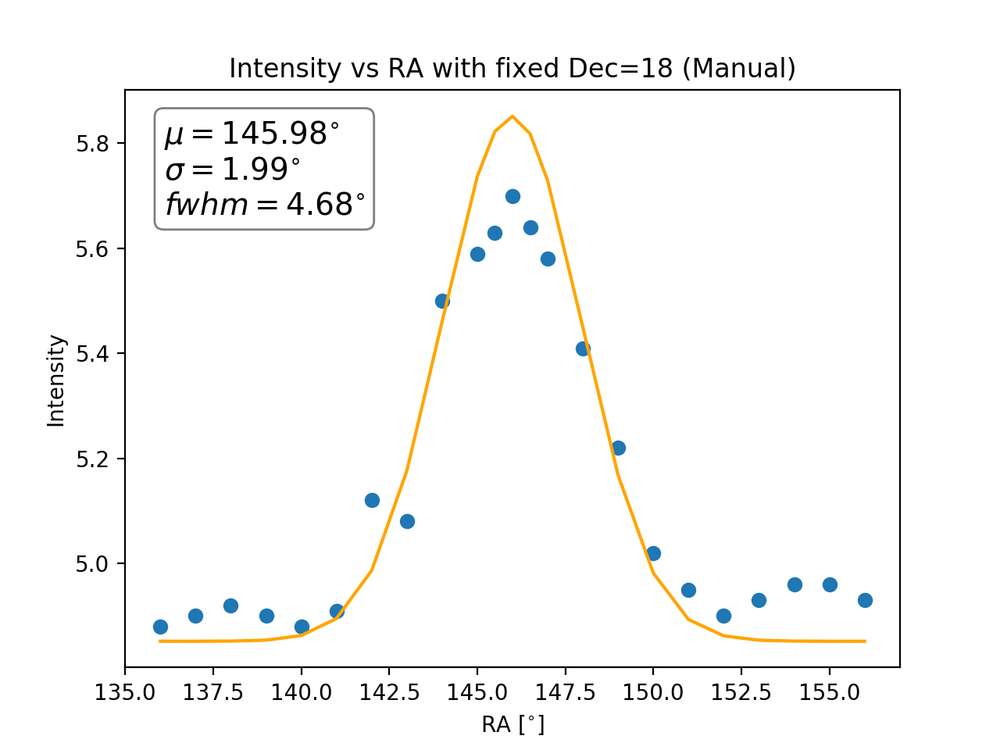

In [42]:
Hr = np.array([9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,10,10,10,10,10,10,10])
Hr_deg = Hr*15

Min = np.array([4,8,12,16,20,24,28,32,36,40,42,44,46,48,52,56,0,4,8,12,16,20,24])
Min_deg = Min*(1/60)*(60/4)

Sec = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
Sec_deg = Sec*(1/(60*60))

RA = Hr_deg + Min_deg + Sec_deg

Intensity = np.array([4.88,4.9,4.92,4.9,4.88,4.91,5.12,5.08,5.5,5.59,5.63,5.7,5.64,5.58,5.41,5.22,5.02,4.95,4.9,4.93,4.96,4.96,4.93])

x, y = RA.copy(), Intensity.copy()

mu = (y*x).sum()/y.sum()
s2 = (y*x**2).sum()/y.sum()
sigma = np.sqrt(s2 - mu**2)

def gauss(x, mu, sigma, shift):
    return shift + np.exp(-((x - mu)**2/(2*sigma**2)))

popt, pcov = curve_fit(gauss,x,y,p0=[mu, sigma, y.min()]) 
fit = gauss(x,*popt)
print("Mean: ", popt[0])
print("Std: ", popt[1])

fwhm = 2*np.sqrt(2*np.log(2))*popt[1]

plt.figure()
plt.scatter(x, y, label='data')
plt.plot(x, fit, color='orange', label='fit')
plt.title("Intensity vs RA with fixed Dec=18 (Manual)")
plt.ylabel("Intensity")
plt.xlabel("RA [$^{\circ}$]")

textstr = '\n'.join((
    r'$\mu=%.2f$$^{\circ}$' % (popt[0], ),
    r'$\sigma=%.2f$$^{\circ}$' % (popt[1], ),
    r'$fwhm=%.2f$$^{\circ}$' % (fwhm, )))

props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# place a text box in upper left in axes coords
ax = plt.gca()
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

## Declination

Mean:  18.77103886054356
Std:  1.3970975995495662


<IPython.core.display.Javascript object>


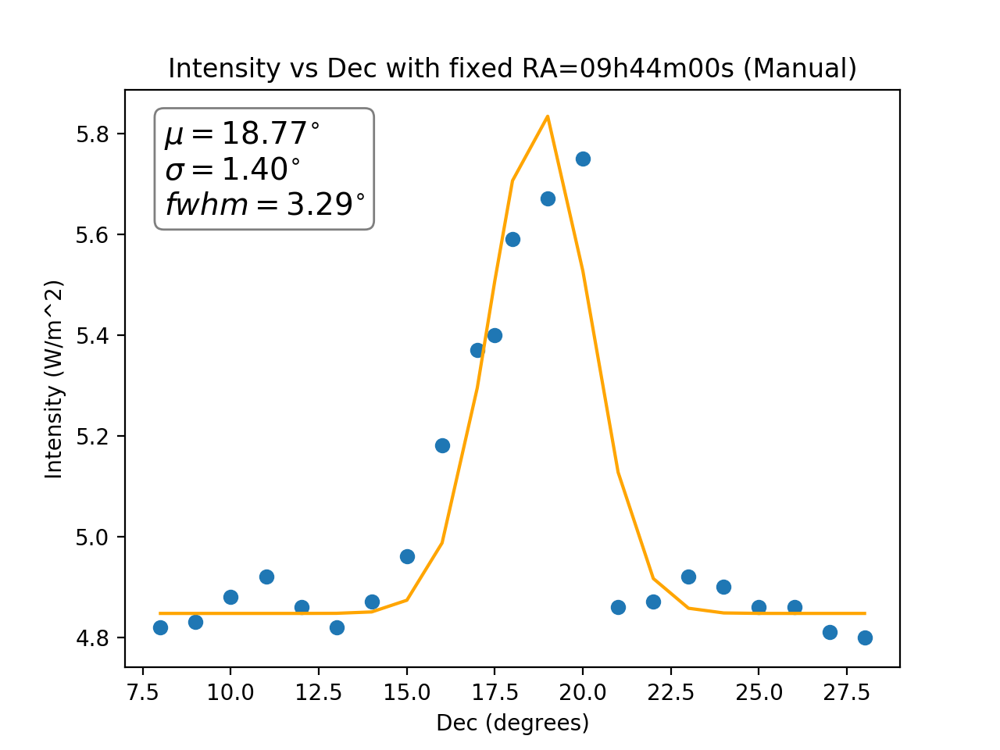

Text(0.05, 0.95, '$\\mu=18.77$$^{\\circ}$\n$\\sigma=1.40$$^{\\circ}$\n$fwhm=3.29$$^{\\circ}$')

In [43]:
dec = np.array([8,9,10,11,12,13,14,15,16,17,17.5,18,19,20,21,22,23,24,25,26,27,28])
intensity = np.array([4.82,4.83,4.88,4.92,4.86,4.82,4.87,4.96,5.18,5.37,5.4,5.59,5.67,5.75,4.86,4.87,4.92,4.9,4.86,4.86,4.81,4.8])

x, y = dec.copy(), intensity.copy()

mu = (y*x).sum()/y.sum()
s2 = (y*x**2).sum()/y.sum()
sigma = np.sqrt(s2 - mu**2)/2

def gauss(x, mu, sigma, shift):
    return shift + np.exp(-((x - mu)**2/(2*sigma**2)))

popt, pcov = curve_fit(gauss,x,y,p0=[mu, sigma, y.min()]) 
fit = gauss(x,*popt)
print("Mean: ", popt[0])
print("Std: ", popt[1])

fwhm = 2*np.sqrt(2*np.log(2))*popt[1]

plt.figure()
plt.scatter(x, y, label='data')
plt.plot(x, fit, color='orange', label='fit')
plt.title("Intensity vs Dec with fixed RA=09h44m00s (Manual)")
plt.ylabel("Intensity (W/m^2)")
plt.xlabel("Dec (degrees)")

textstr = '\n'.join((
    r'$\mu=%.2f$$^{\circ}$' % (popt[0], ),
    r'$\sigma=%.2f$$^{\circ}$' % (popt[1], ),
    r'$fwhm=%.2f$$^{\circ}$' % (fwhm, )))

props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# place a text box in upper left in axes coords
ax = plt.gca()
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)